Tutorials of CPS using HBC dataset
===
**Interpretations of attention scores**
1. read the dataset
2. construct the graph (construct the multi-scale features, option)
2. train the model
3. generate the arbitrary resolution spots
4. visualize the results

In [1]:
import os,sys
sys.path.append(os.path.realpath(os.path.join(os.getcwd(), '..')))
import warnings
warnings.filterwarnings("ignore")

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import CPS

In [3]:
opt = CPS.config()
args = opt.parse_args(['--seed', '2025'])
args.prep_scale = False
args.sh_weights = True
args.dataset_path = '/mnt/d/Dataset/SRT_Dataset/4-Human_Breast_Cancer'
args.radius=300
args.clusters=20
args.self_loops=False
CPS.set_random_seed(args.seed)
args

Namespace(batch_size=256, clusters=20, coord_dim=2, dataset_path='/mnt/d/Dataset/SRT_Dataset/4-Human_Breast_Cancer', decoder='MLP', decoder_latent=[256, 512], distill=0.5, dropout=0.2, flow='source_to_target', freq=32, gpu=0, hvgs=3000, inr_latent=[256, 256, 256], k_list=[0, 1, 2, 3, 4, 5, 6, 7], latent_dim=64, lr=0.0001, max_epoch=500, max_neighbors=6, n_spot=0, num_heads=8, prep_scale=False, radius=300, seed=2025, self_loops=False, sh_weights=True, sigma=10.0, visual=True, weight_decay=0.0001)

Read the adata

In [4]:
adata = sc.read_visium(path=args.dataset_path, count_file='filtered_feature_bc_matrix.h5')
Ann_df = pd.read_csv(os.path.join(args.dataset_path, 'metadata.tsv'), sep='\t', header=0, index_col=0)
adata.obs['Ground Truth'] = Ann_df.loc[adata.obs_names, 'ground_truth']
adata

AnnData object with n_obs × n_vars = 3798 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'Ground Truth'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

Preprocess adata

In [5]:
adata.var_names_make_unique()
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=args.hvgs)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.scale(adata, zero_center=True, max_value=10)

adata_hvg = adata[:, adata.var['highly_variable']].copy()
adata.obsm['hvg_features'] = adata_hvg.X

Construct the spatial graph

In [6]:
spatial_edge = CPS.SpatialGraphBuilder(args)
pyg_data = spatial_edge.build_single_graph(adata, method='rknn')
print(pyg_data.num_nodes, pyg_data.num_genes, pyg_data.edge_index.shape)

3798 3000 torch.Size([2, 22064])


Train the CPS model

In [7]:
cps_model = CPS.CPSTrainer(args)
cps_model.fit(pyg_data)

  0%|          | 0/499 [00:00<?, ?it/s]

1.4336482286453247
1.4208760261535645
1.4093581438064575
1.399143934249878
1.3899179697036743
1.38168466091156
1.374375581741333
1.3675984144210815
1.361265778541565
1.35590660572052
1.3506325483322144
1.3461010456085205
1.3417458534240723
1.337913155555725
1.3342840671539307
1.330967903137207
1.3279749155044556
1.325088620185852
1.3224374055862427
1.3201488256454468
1.317819595336914
1.3156025409698486
1.313576102256775
1.3117032051086426
1.3098809719085693
1.3083220720291138
1.3067383766174316
1.3052986860275269
1.303844928741455
1.3025819063186646
1.301148772239685
1.2999318838119507
1.2989740371704102
1.2977449893951416
1.2967453002929688
1.2957545518875122
1.2948405742645264
1.2938742637634277
1.2929842472076416
1.2921401262283325
1.2912348508834839
1.29050612449646
1.2897614240646362
1.28903067111969
1.288284420967102
1.287636160850525
1.2869789600372314
1.2863324880599976
1.2856882810592651
1.2849992513656616
1.2844038009643555
1.283779501914978
1.283288598060608
1.2826471328735

Downstream analysis

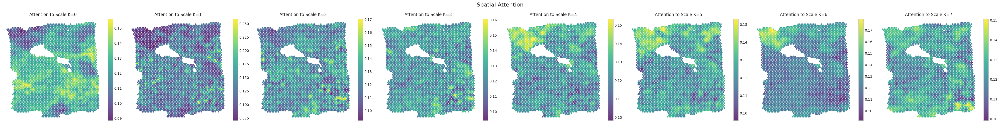

In [18]:
latent, attn = cps_model.infer_att_scores(pyg_data)
adata.obsm['z_t'] = latent
adata.obsm['attn'] = attn.reshape(adata.n_obs, 64)

In [9]:
# adata.obsm['attn'].shape, 
adata.obsm['z_t'].shape, 

((3798, 64),)

fitting ...
  |======================================================================| 100%


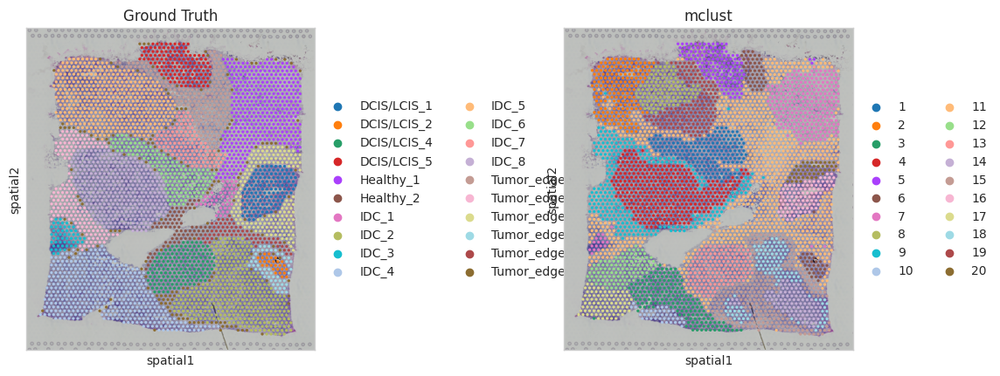

In [60]:
adata = CPS.mclust(adata, args, key='z_t', pca_dim=64)
sc.pl.spatial(adata, img_key="hires", color=["Ground Truth", "mclust"])

fitting ...
  |======================================================================| 100%


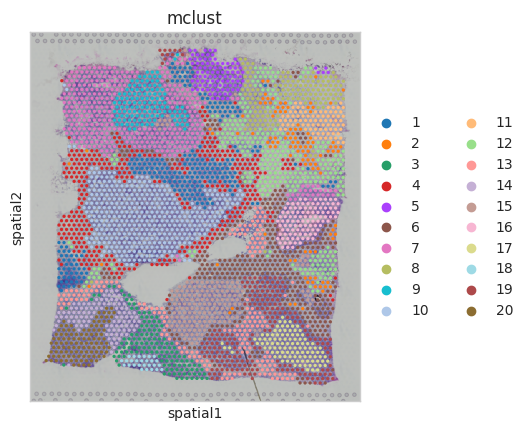

In [61]:
adata = CPS.mclust(adata, args, key='attn', pca_dim=32)
sc.pl.spatial(adata, img_key="hires", color=["mclust"])

In [62]:
adata = adata[~pd.isnull(adata.obs['Ground Truth'])]
obs_df = adata.obs.dropna()
from sklearn.metrics.cluster import adjusted_rand_score
ARI = adjusted_rand_score(obs_df['mclust'], obs_df['Ground Truth'])
print('Adjusted rand index = %.4f' %ARI)

Adjusted rand index = 0.3888


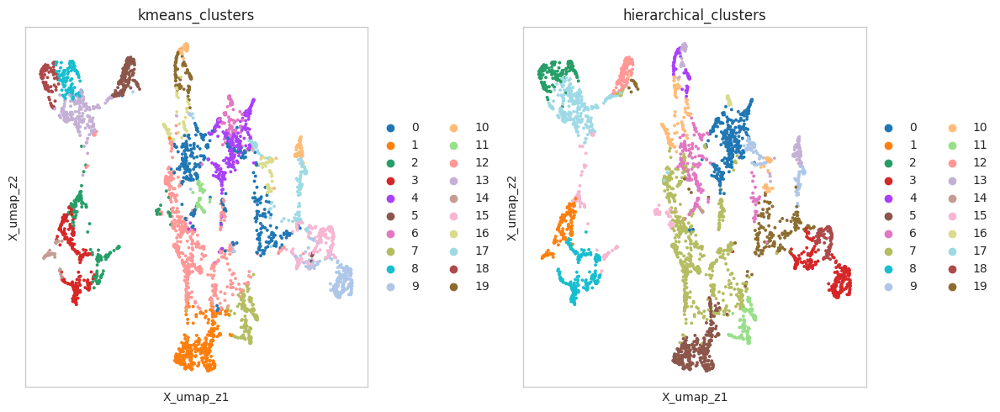

In [32]:
import scanpy as sc
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from scipy.sparse import csr_matrix

# 1. 获取隐空间表征
z = adata.obsm['z_t'] 

from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
import umap
import matplotlib.pyplot as plt

# 1. 使用K-means聚类（需要指定k值）
k = 20
kmeans = KMeans(n_clusters=k, random_state=42)
adata.obs['kmeans_clusters'] = kmeans.fit_predict(z).astype(str)

# 2. 使用层次聚类
agg_cluster = AgglomerativeClustering(n_clusters=k, linkage='ward')
adata.obs['hierarchical_clusters'] = agg_cluster.fit_predict(z).astype(str)

# 3. 可视化聚类结果
# 先降维可视化
reducer = umap.UMAP(random_state=42)
z_umap = reducer.fit_transform(z)
adata.obsm['X_umap_z'] = z_umap

# 绘制聚类结果
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sc.pl.embedding(adata, basis='X_umap_z', color='kmeans_clusters', ax=axes[0], show=False)
sc.pl.embedding(adata, basis='X_umap_z', color='hierarchical_clusters', ax=axes[1], show=False)
plt.tight_layout()
plt.show()


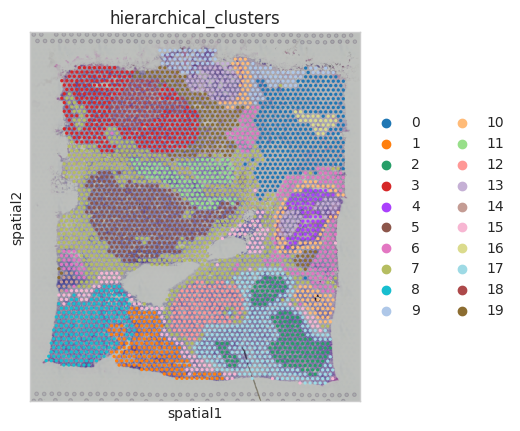

In [33]:
sc.pl.spatial(adata, img_key="hires", color=["hierarchical_clusters"])

In [34]:
adata = adata[~pd.isnull(adata.obs['Ground Truth'])]
obs_df = adata.obs.dropna()
from sklearn.metrics.cluster import adjusted_rand_score
ARI = adjusted_rand_score(obs_df['hierarchical_clusters'], obs_df['Ground Truth'])
print('Adjusted rand index = %.4f' %ARI)

Adjusted rand index = 0.4651


In [38]:
from sklearn.cluster import SpectralClustering

# 1. 获取KNN图
n_neighbors = 15
nbrs = NearestNeighbors(n_neighbors=n_neighbors).fit(z)
adj_matrix = nbrs.kneighbors_graph(z).toarray()

# 2. 谱聚类
n_clusters = 20
spectral = SpectralClustering(n_clusters=n_clusters, 
                              affinity='precomputed',
                              random_state=42)
adata.obs['spectral_clusters'] = spectral.fit_predict(adj_matrix).astype(str)

# 3. 评估聚类质量（可选）
from sklearn.metrics import silhouette_score
sil_score = silhouette_score(z, adata.obs['spectral_clusters'].astype(int))
print(f"Silhouette Score: {sil_score:.3f}")

Silhouette Score: 0.196


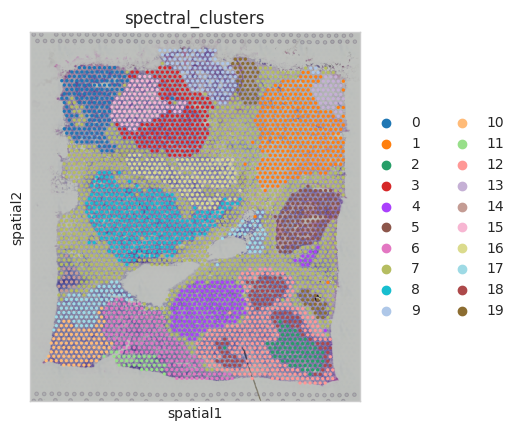

In [39]:
sc.pl.spatial(adata, img_key="hires", color=["spectral_clusters"])

In [40]:
adata = adata[~pd.isnull(adata.obs['Ground Truth'])]
obs_df = adata.obs.dropna()
from sklearn.metrics.cluster import adjusted_rand_score
ARI = adjusted_rand_score(obs_df['spectral_clusters'], obs_df['Ground Truth'])
print('Adjusted rand index = %.4f' %ARI)

Adjusted rand index = 0.3246


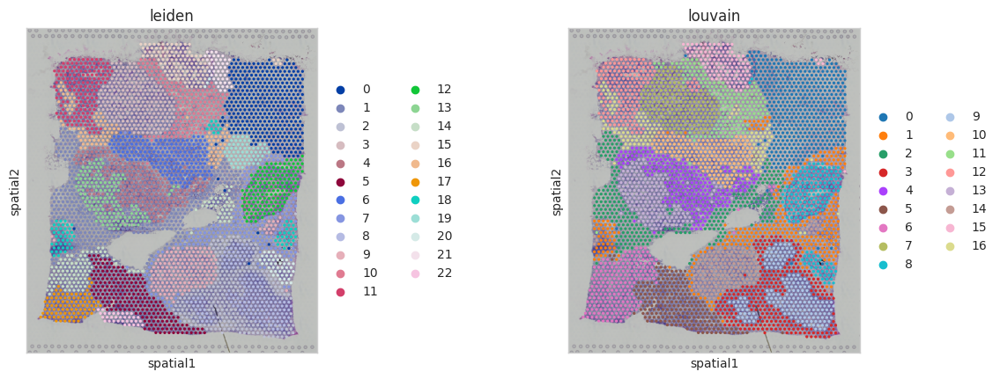

Adjusted rand index = 0.5111
Adjusted rand index = 0.5198


In [59]:
import scanpy as sc
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from scipy.sparse import csr_matrix

# 1. 获取隐空间表征
z = adata.obsm['z_t']  # 形状: (n_cells, latent_dim)

# 2. 使用KNN构建邻接图
n_neighbors = 20
nbrs = NearestNeighbors(n_neighbors=n_neighbors, metric='euclidean')
nbrs.fit(z)
distances, indices = nbrs.kneighbors(z)

# 3. 可以转换为scanpy可用的邻接矩阵
from scipy.sparse import csr_matrix
knn_graph = csr_matrix((np.ones_like(distances.ravel()), 
                       indices.ravel(), 
                       range(0, distances.size+1, n_neighbors)), 
                      shape=(adata.n_obs, adata.n_obs))

# 4. 存储邻接矩阵到adata
adata.obsp['distances'] = knn_graph

# 5. 使用Leiden或Louvain聚类（基于KNN图）
sc.pp.neighbors(adata, use_rep='z_t', knn=25)  # 使用隐空间表征
sc.tl.leiden(adata, resolution=1)  # 聚类结果存入 adata.obs['leiden']
# 或
sc.tl.louvain(adata, resolution=1)  # 聚类结果存入 adata.obs['louvain']
sc.pl.spatial(adata, img_key="hires", color=["leiden",'louvain'])
# 查看聚类结果
adata = adata[~pd.isnull(adata.obs['Ground Truth'])]
obs_df = adata.obs.dropna()
from sklearn.metrics.cluster import adjusted_rand_score
ARI = adjusted_rand_score(obs_df['leiden'], obs_df['Ground Truth'])
print('Adjusted rand index = %.4f' %ARI)
ARI = adjusted_rand_score(obs_df['louvain'], obs_df['Ground Truth'])
print('Adjusted rand index = %.4f' %ARI)

SES/SE

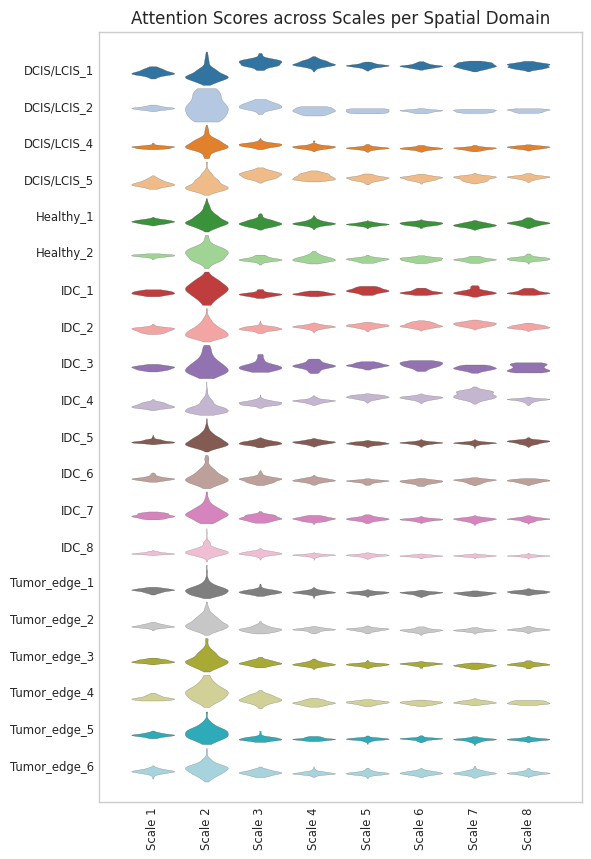

In [63]:
attn = np.mean(attn, axis=2)
adata.obsm['attn'] = attn
import scanpy as sc
import pandas as pd
import numpy as np

# 1. 提取数据
# 假设 adata.obsm['attn'] 的形状是 (n_cells, n_scales)
attn_data = adata.obsm['attn']
n_scales = attn_data.shape[1]

# 2. 构建临时的 AnnData 对象
# 我们将 attention score 当作 "基因" 放入 X 中
adata_attn = sc.AnnData(X=attn_data)

# 3. 转移元数据 (Obs)
# 必须把 Ground Truth 标签复制过来，用于分组
adata_attn.obs['Ground Truth'] = adata.obs['Ground Truth'].values

# 4. 命名变量 (Var)
# 给每一个尺度起个名字，这将成为横轴的标签
scale_names = [f'Scale {i+1}' for i in range(n_scales)]
adata_attn.var_names = scale_names

# 5. 绘制堆叠小提琴图 (Stacked Violin)
# groupby: 纵轴的分组依据 (20个空间域)
# var_names: 横轴的变量 (不同尺度)
sc.pl.stacked_violin(
    adata_attn, 
    var_names=scale_names, 
    groupby='Ground Truth',
    figsize=(8, 10),       # 根据你的空间域数量调整高度
    dendrogram=False,      # 如果不需要对空间域聚类排序，设为 False
    cmap='viridis',        # 设置颜色映射
    stripplot=False,       # 去掉内部的散点，使图像更干净
    row_palette='tab20',   # 左侧颜色条的配色
    title='Attention Scores across Scales per Spatial Domain',
    swap_axes=False        # 默认 False: 横轴是 Scale, 纵轴是 Ground Truth
)

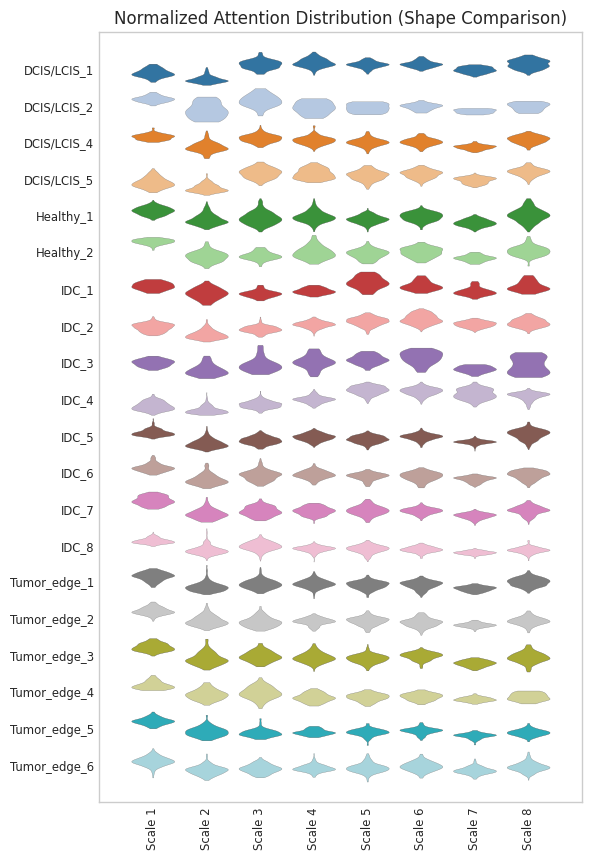

In [66]:
# 方法：添加 standard_scale='var'
sc.pl.stacked_violin(
    adata_attn, 
    var_names=scale_names, 
    groupby='Ground Truth',
    standard_scale='var',  # <--- 关键参数：对每个 Scale 单独归一化到 0-1
    figsize=(8, 10),
    row_palette='tab20',
    title='Normalized Attention Distribution (Shape Comparison)',
    swap_axes=False
)

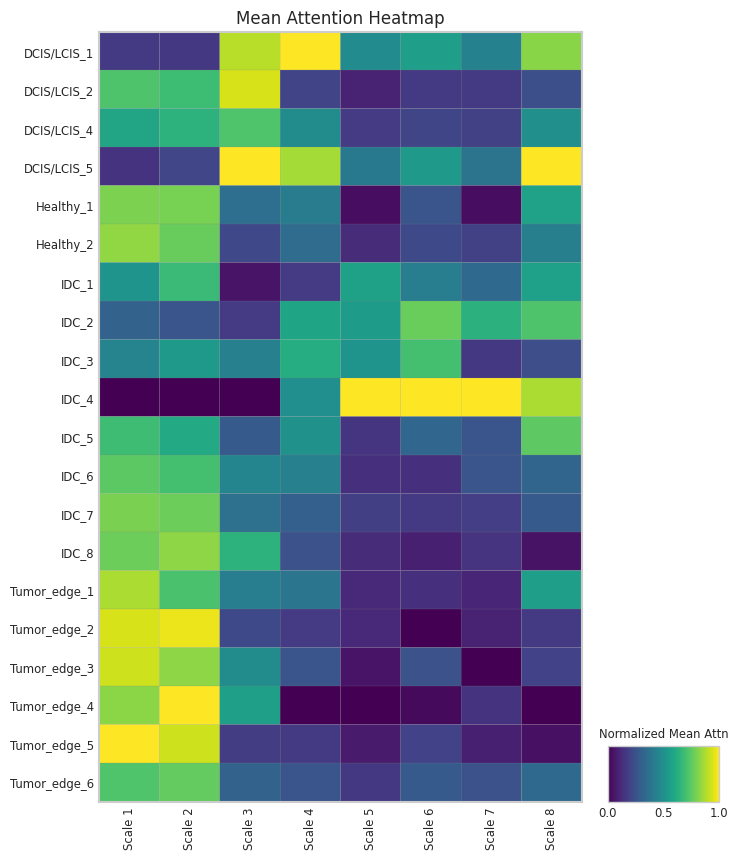

In [87]:
sc.pl.matrixplot(
    adata_attn, 
    var_names=scale_names, 
    groupby='Ground Truth',
    standard_scale='var', # 同样推荐归一化，否则 Scale 2 会霸占所有颜色
    cmap='viridis',
    colorbar_title='Normalized Mean Attn',
    figsize=(8, 10),
    title='Mean Attention Heatmap'
)

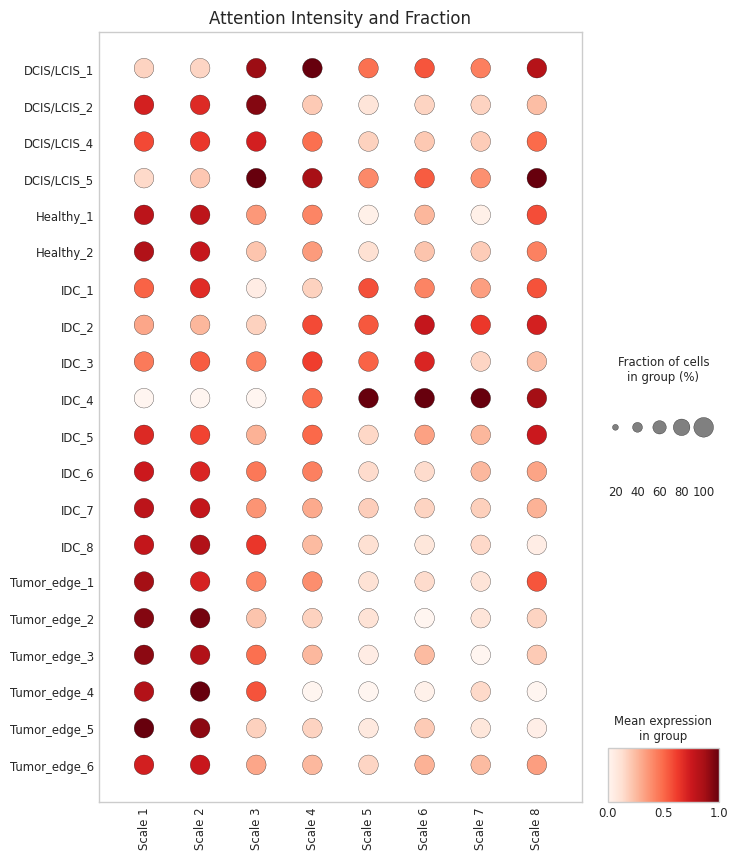

In [94]:
sc.pl.dotplot(
    adata_attn, 
    var_names=scale_names, 
    groupby='Ground Truth',
    standard_scale='var',  # 依然建议归一化，以便看清小尺度的变化
    cmap='Reds',
    figsize=(8, 10),
    title='Attention Intensity and Fraction'
)

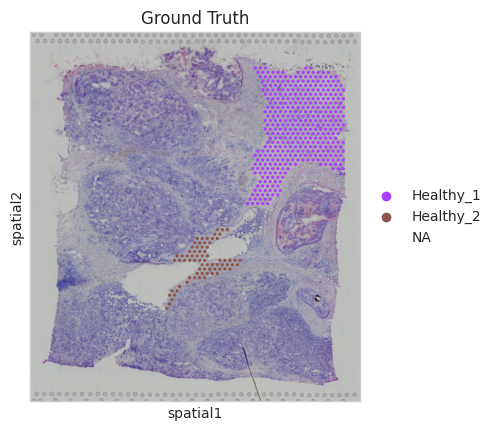

In [85]:
sc.pl.spatial(adata, img_key="hires", color=["Ground Truth"], groups=['Healthy_1','Healthy_2'])# 'Tumor_edge_5'

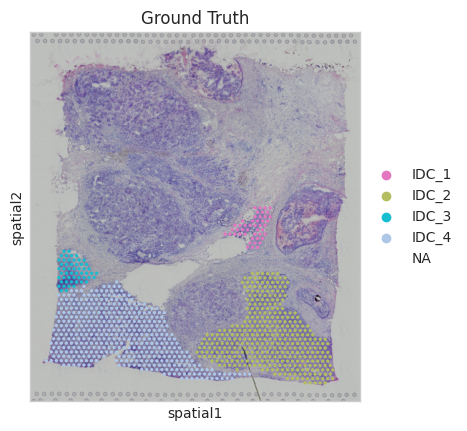

In [88]:
sc.pl.spatial(adata, img_key="hires", color=["Ground Truth"], groups=['IDC_1','IDC_2','IDC_4','IDC_3'])

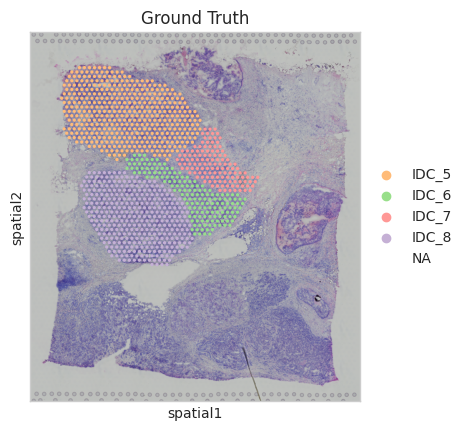

In [89]:
sc.pl.spatial(adata, img_key="hires", color=["Ground Truth"], groups=['IDC_5','IDC_6','IDC_7','IDC_8'])

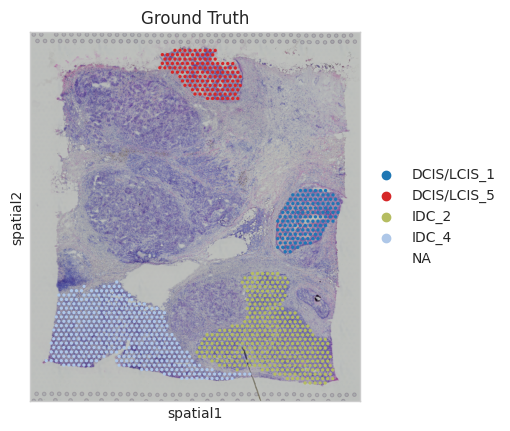

In [76]:
sc.pl.spatial(adata, img_key="hires", color=["Ground Truth"], groups=['DCIS/LCIS_1','DCIS/LCIS_5','IDC_4','IDC_2'])

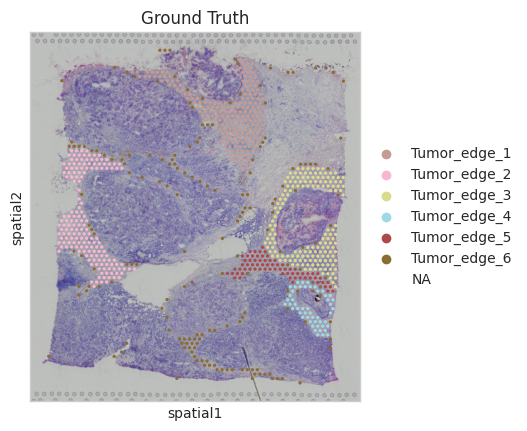

In [92]:
sc.pl.spatial(adata, img_key="hires", color=["Ground Truth"], groups=['Tumor_edge_1','Tumor_edge_2',
                                                                      'Tumor_edge_3','Tumor_edge_4',
                                                                      'Tumor_edge_5','Tumor_edge_6'])

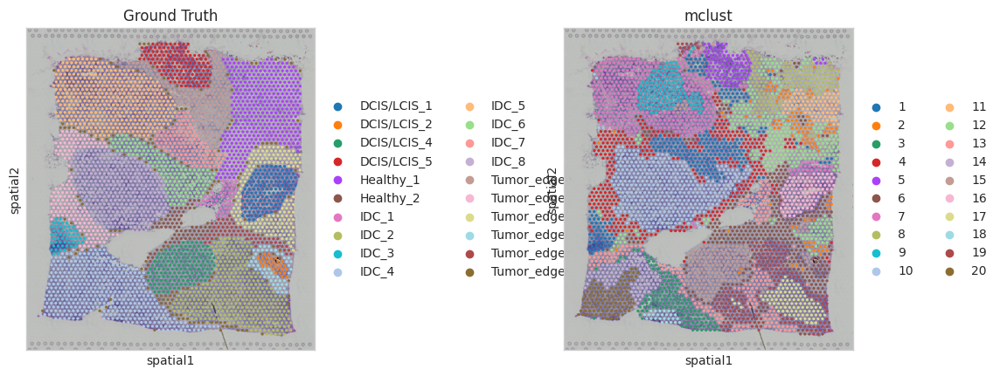

In [69]:
sc.pl.spatial(adata, img_key="hires", color=["Ground Truth", "mclust"])

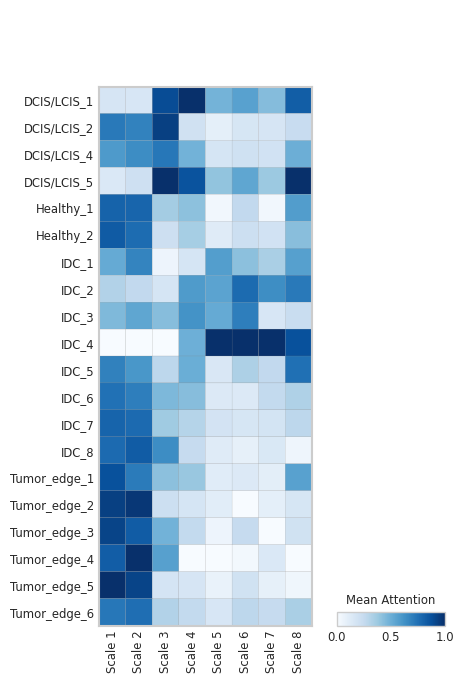

In [64]:
sc.pl.matrixplot(
    adata_attn, 
    var_names=scale_names, 
    groupby='Ground Truth', 
    colorbar_title='Mean Attention',
    cmap='Blues',
    standard_scale='var' # 可选：对每个尺度进行归一化 (0-1)，便于对比
)

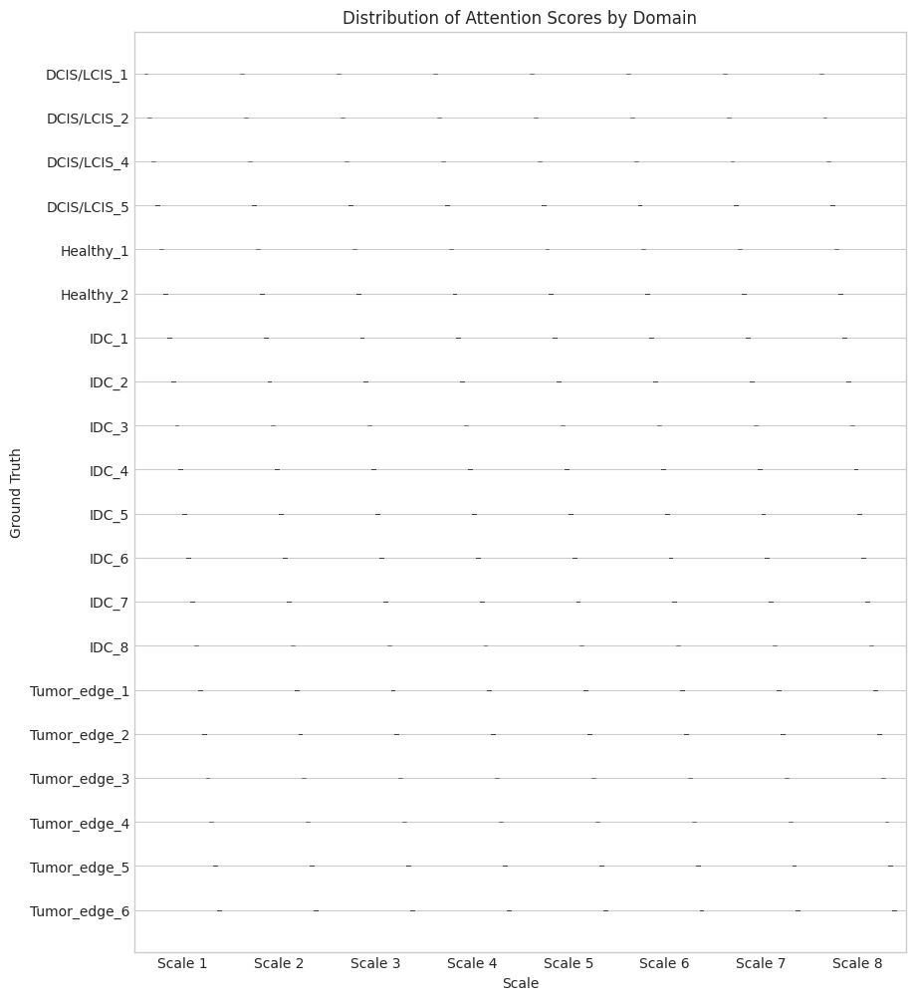

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. 准备 DataFrame
df = pd.DataFrame(adata.obsm['attn'], columns=[f'Scale {i+1}' for i in range(n_scales)])
df['Ground Truth'] = adata.obs['Ground Truth'].values

# 2. 转换为长格式 (Long Format) 以适配 Seaborn
df_melt = df.melt(id_vars=['Ground Truth'], var_name='Scale', value_name='Attention Score')

# 3. 绘图
plt.figure(figsize=(10, 12))
sns.violinplot(
    data=df_melt,
    x='Scale',           # 横轴
    y='Ground Truth',    # 纵轴
    hue='Ground Truth',  # 颜色
    density_norm='width', # 让所有小提琴宽度一致，便于视觉对比
    inner=None,          # 不显示内部箱线图
    linewidth=0.5,
    legend=False
)

# 叠加该死的均值点（如果需要）
# sns.pointplot(data=df_melt, x='Scale', y='Attention Score', hue='Ground Truth', ...)

plt.title("Distribution of Attention Scores by Domain")
plt.show()

In [13]:
attn = np.mean(attn, axis=2)
attn = np.clip(attn, 1e-10, 1.0)
attn = attn / attn.sum(axis=1, keepdims=True)
weights = np.arange(1, 9)  # 尺度权重
SES = attn @ np.log(weights)
SE = -np.sum(attn * np.log(attn), axis=1)
adata.obs['SES'] = SES
adata.obs['SE'] = SE

[<Axes: title={'center': 'SES'}, xlabel='spatial1', ylabel='spatial2'>]

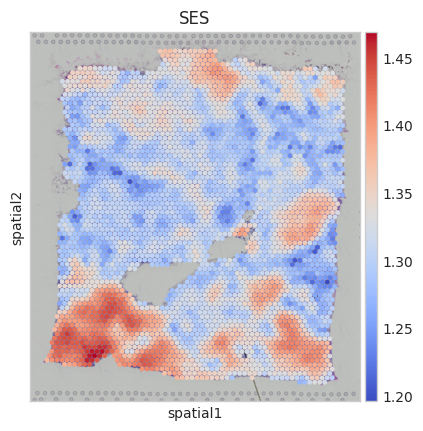

In [14]:
temp_adata = adata.copy()
temp_adata.obs['SES'] = SES
sc.pl.spatial(temp_adata, 
                color='SES',
                show=False, cmap='coolwarm',
                size=1.5)

[<Axes: title={'center': 'SE'}, xlabel='spatial1', ylabel='spatial2'>]

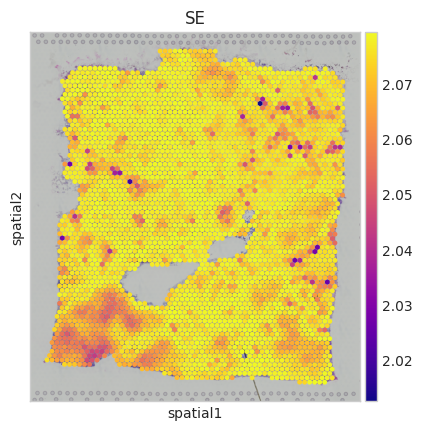

In [15]:
temp_adata = adata.copy()
temp_adata.obs['SE'] = SE
sc.pl.spatial(temp_adata, 
                color='SE',
                show=False, 
                cmap='plasma',
                size=1.5)